# Decade of Urban Growth: 2016-2025

In this notebook, we'll track urban expansion over **10 years** using Sentinel-2 satellite data.

**Why Sentinel-2?**
- Higher resolution (10m vs Landsat's 30m)
- Continuous data from **2015 to present**
- Better for detailed urban analysis

**What we'll see:**
- Year-by-year urban transformation from 2016 to 2025
- 10 snapshots showing gradual development
- Quantified growth rates over the decade

---
## 1. Setup

In [1]:
from pystac_client import Client
import planetary_computer as pc
from odc.stac import stac_load

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings('ignore')

catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
print("Connected to Planetary Computer")

Connected to Planetary Computer


---
## 2. Understanding Sentinel-2

| Aspect | Details |
|--------|---------|
| Mission start | June 2015 |
| Resolution | 10m (visible/NIR), 20m (SWIR) |
| Revisit time | 5 days |
| Coverage | Global |

**Bands we'll use:**
- B02 (Blue), B03 (Green), B04 (Red) - True color
- B08 (NIR) - Vegetation structure
- B11 (SWIR) - Built-up detection

---
## 3. Select Location and Time Periods

We'll analyze a region near **Bangalore, India** across 10 years (2016-2025).

Bangalore is one of India's fastest-growing cities, known as the "Silicon Valley of India." The region has experienced massive urban expansion and infrastructure development over the past decade.

In [8]:
# Bangalore region, India
# Converting from lat,lon points to bbox [min_lon, min_lat, max_lon, max_lat]
# Adjusted to create square images (equal lat/lon range)
city_name = "Bangalore Region, India"
bbox = [77.6746, 13.1647, 77.7433, 13.2334]  # ~7.5km x 7.5km square

# 10 years of data - using Oct-Dec to avoid monsoon clouds
time_periods = {
    "2016": "2016-10-01/2016-12-31",
    "2017": "2017-10-01/2017-12-31",
    "2018": "2018-10-01/2018-12-31",
    "2019": "2019-10-01/2019-12-31",
    "2020": "2020-10-01/2020-12-31",
    "2021": "2021-10-01/2021-12-31",
    "2022": "2022-10-01/2022-12-31",
    "2023": "2023-10-01/2023-12-31",
    "2024": "2024-10-01/2024-12-31",
    "2025": "2025-01-01/2025-01-31",
}

print(f"Location: {city_name}")
print(f"Bbox: {bbox}")
lon_range = bbox[2] - bbox[0]
lat_range = bbox[3] - bbox[1]
print(f"Lon range: {lon_range:.4f}° | Lat range: {lat_range:.4f}° (ratio: {lon_range/lat_range:.2f})")
print(f"\nTime periods to analyze ({len(time_periods)} years):")
for label, dates in time_periods.items():
    print(f"  {label}: {dates}")

Location: Bangalore Region, India
Bbox: [77.6746, 13.1647, 77.7433, 13.2334]
Lon range: 0.0687° | Lat range: 0.0687° (ratio: 1.00)

Time periods to analyze (10 years):
  2016: 2016-10-01/2016-12-31
  2017: 2017-10-01/2017-12-31
  2018: 2018-10-01/2018-12-31
  2019: 2019-10-01/2019-12-31
  2020: 2020-10-01/2020-12-31
  2021: 2021-10-01/2021-12-31
  2022: 2022-10-01/2022-12-31
  2023: 2023-10-01/2023-12-31
  2024: 2024-10-01/2024-12-31
  2025: 2025-01-01/2025-01-31


---
## 4. Helper Functions for Sentinel-2

In [9]:
def normalize_for_display(img, pmin=2, pmax=98):
    """Normalize image to 0-1 range for display."""
    lo, hi = np.nanpercentile(img, [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-6), 0, 1)

def compute_ndbi(swir, nir):
    """Compute Normalized Difference Built-up Index: (SWIR - NIR) / (SWIR + NIR)"""
    swir = swir.astype('float32')
    nir = nir.astype('float32')
    return (swir - nir) / (swir + nir + 1e-6)

def compute_ndvi(nir, red):
    """Compute Normalized Difference Vegetation Index: (NIR - Red) / (NIR + Red)"""
    nir = nir.astype('float32')
    red = red.astype('float32')
    return (nir - red) / (nir + red + 1e-6)

def load_sentinel_image(catalog, bbox, date_range, max_cloud=20):
    """
    Load a Sentinel-2 image for the given location and date range.
    """
    search = catalog.search(
        collections=["sentinel-2-l2a"],
        bbox=bbox,
        datetime=date_range,
        query={"eo:cloud_cover": {"lt": max_cloud}},
    )
    items = list(search.items())
    
    if len(items) == 0:
        print(f"  No images with <{max_cloud}% clouds. Trying with <40% clouds...")
        search = catalog.search(
            collections=["sentinel-2-l2a"],
            bbox=bbox,
            datetime=date_range,
            query={"eo:cloud_cover": {"lt": 40}},
        )
        items = list(search.items())
    
    if len(items) == 0:
        raise ValueError(f"No images found for {date_range}")
    
    # Get clearest image
    items_sorted = sorted(items, key=lambda x: x.properties.get('eo:cloud_cover', 100))
    item = items_sorted[0]
    
    signed_item = pc.sign(item)
    
    data = stac_load(
        [signed_item],
        bands=["B02", "B03", "B04", "B08", "B11"],
        bbox=bbox,
        crs="EPSG:4326",
        resolution=0.0002,  # ~20m
        groupby="solar_day",
    )
    
    return data, item

print("Helper functions defined.")

Helper functions defined.


---
## 5. Load Images from All 10 Years

In [10]:
# Store results
images = {}

for label, date_range in time_periods.items():
    print(f"\nLoading {label}...")
    try:
        data, item = load_sentinel_image(catalog, bbox, date_range)
        images[label] = {
            'data': data,
            'item': item,
            'date': item.datetime.strftime('%Y-%m-%d'),
            'cloud': item.properties.get('eo:cloud_cover', 0)
        }
        print(f"  Date: {images[label]['date']}")
        print(f"  Cloud cover: {images[label]['cloud']:.1f}%")
    except Exception as e:
        print(f"  ERROR: {e}")
        images[label] = None

# Check which periods we got
available_periods = [k for k, v in images.items() if v is not None]
print(f"\nSuccessfully loaded: {len(available_periods)}/{len(time_periods)} years")


Loading 2016...
  Date: 2016-11-25
  Cloud cover: 0.6%

Loading 2017...
  Date: 2017-12-20
  Cloud cover: 4.2%

Loading 2018...
  Date: 2018-10-26
  Cloud cover: 0.3%

Loading 2019...
  Date: 2019-11-05
  Cloud cover: 6.1%

Loading 2020...
  Date: 2020-12-29
  Cloud cover: 4.3%

Loading 2021...
  Date: 2021-12-24
  Cloud cover: 0.2%

Loading 2022...
  Date: 2022-10-25
  Cloud cover: 0.0%

Loading 2023...
  Date: 2023-10-25
  Cloud cover: 0.1%

Loading 2024...
  Date: 2024-12-08
  Cloud cover: 12.7%

Loading 2025...
  Date: 2025-01-07
  Cloud cover: 1.2%

Successfully loaded: 10/10 years


---
## 6. Process All Images

In [11]:
# Process each image - extract bands, compute indices
processed = {}

for label, img_data in images.items():
    if img_data is None:
        continue
    
    data = img_data['data']
    
    # Extract Sentinel-2 bands
    red = data["B04"].isel(time=0).values
    green = data["B03"].isel(time=0).values
    blue = data["B02"].isel(time=0).values
    nir = data["B08"].isel(time=0).values
    swir = data["B11"].isel(time=0).values
    
    # Create RGB composite
    rgb = normalize_for_display(np.stack([red, green, blue], axis=-1))
    
    # Compute indices
    ndbi = compute_ndbi(swir, nir)
    ndvi = compute_ndvi(nir, red)
    
    # Calculate urban percentage
    urban_pct = 100 * np.sum(ndbi > 0.05) / ndbi.size
    
    processed[label] = {
        'rgb': rgb,
        'ndbi': ndbi,
        'ndvi': ndvi,
        'urban_pct': urban_pct,
        'date': img_data['date']
    }
    
    print(f"{label}: Urban coverage = {urban_pct:.1f}%")

# Get image shape from first available
first_key = list(processed.keys())[0]
img_height, img_width = processed[first_key]['rgb'].shape[:2]
aspect_ratio = img_width / img_height
print(f"\nImage dimensions: {img_height} x {img_width}, aspect ratio: {aspect_ratio:.2f}")

2016: Urban coverage = 65.1%
2017: Urban coverage = 52.7%
2018: Urban coverage = 38.1%
2019: Urban coverage = 31.7%
2020: Urban coverage = 64.5%
2021: Urban coverage = 43.0%
2022: Urban coverage = 20.6%
2023: Urban coverage = 24.1%
2024: Urban coverage = 32.5%
2025: Urban coverage = 42.7%

Image dimensions: 344 x 344, aspect ratio: 1.00


---
## 7. True Color Comparison Across Decades

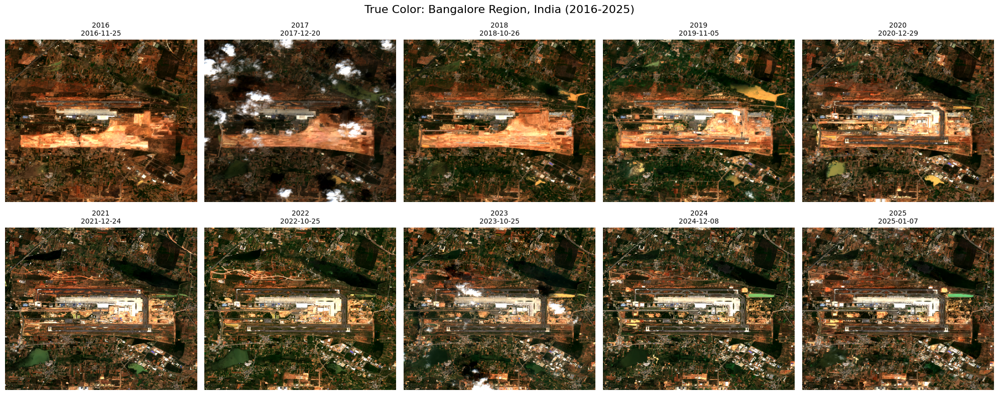

In [12]:
# Plot all available periods in 2 rows of 5
n_periods = len(processed)
n_cols = 5
n_rows = (n_periods + n_cols - 1) // n_cols  # Ceiling division

subplot_width = 4
subplot_height = subplot_width / aspect_ratio

fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_width * n_cols, subplot_height * n_rows))
axes = axes.flatten()

for idx, (label, data) in enumerate(processed.items()):
    axes[idx].imshow(data['rgb'], aspect='auto')
    axes[idx].set_title(f"{label}\n{data['date']}", fontsize=10)
    axes[idx].axis('off')

# Hide any unused subplots
for idx in range(len(processed), len(axes)):
    axes[idx].axis('off')

plt.suptitle(f"True Color: {city_name} (2016-2025)", fontsize=16)
plt.tight_layout()
plt.show()

---
## 8. NDBI Comparison Across Decades

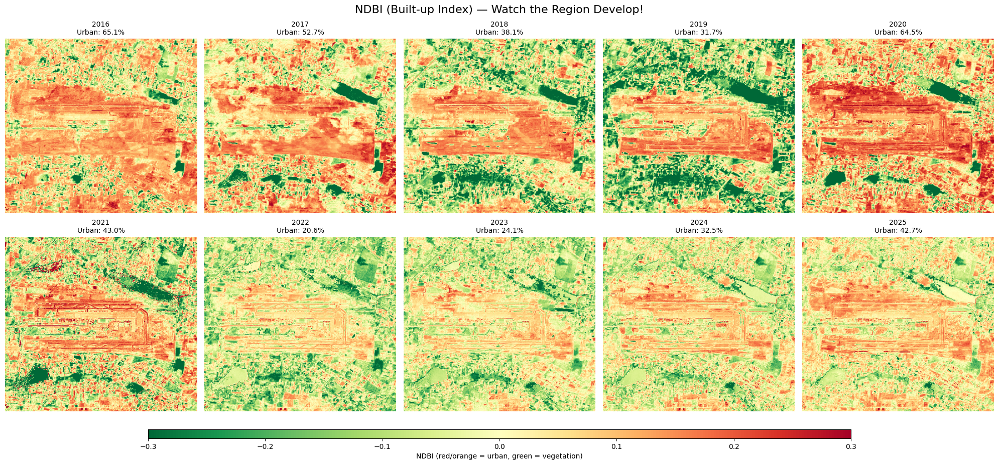

In [13]:
# NDBI comparison in 2 rows of 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_width * n_cols, subplot_height * n_rows + 1))
axes = axes.flatten()

for idx, (label, data) in enumerate(processed.items()):
    im = axes[idx].imshow(data['ndbi'], cmap='RdYlGn_r', vmin=-0.3, vmax=0.3, aspect='auto')
    axes[idx].set_title(f"{label}\nUrban: {data['urban_pct']:.1f}%", fontsize=10)
    axes[idx].axis('off')

# Hide any unused subplots
for idx in range(len(processed), len(axes)):
    axes[idx].axis('off')

plt.suptitle("NDBI (Built-up Index) — Watch the Region Develop!", fontsize=16)
plt.tight_layout()

# Add colorbar
cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.02])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label('NDBI (red/orange = urban, green = vegetation)', fontsize=10)
plt.subplots_adjust(bottom=0.08)
plt.show()

---
## 9. Urban Growth Timeline

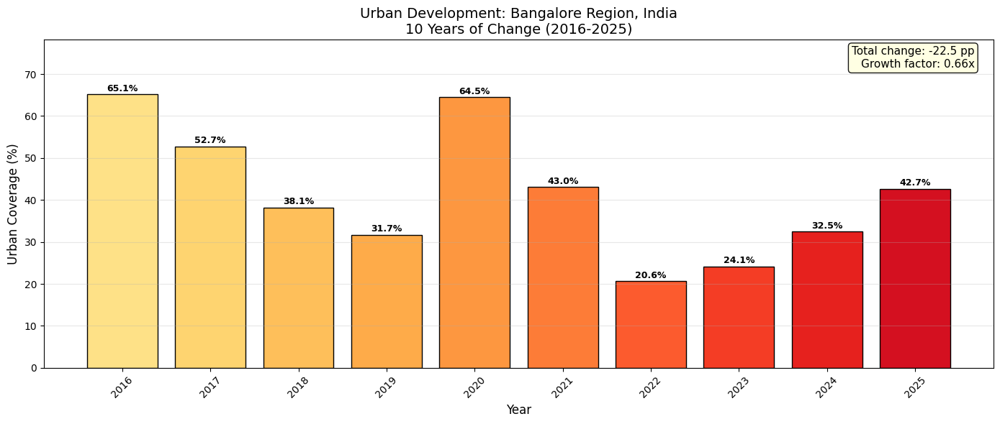

In [14]:
# Create urban growth chart
years = []
urban_pcts = []
labels = []

for label, data in processed.items():
    year = int(data['date'][:4])
    years.append(year)
    urban_pcts.append(data['urban_pct'])
    labels.append(label)

fig, ax = plt.subplots(figsize=(14, 6))

# Bar chart with gradient colors
colors = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(labels)))
bars = ax.bar(labels, urban_pcts, color=colors, edgecolor='black', linewidth=1)

# Add value labels on bars
for bar, pct in zip(bars, urban_pcts):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3, 
            f'{pct:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='bold')

ax.set_ylabel('Urban Coverage (%)', fontsize=12)
ax.set_xlabel('Year', fontsize=12)
ax.set_title(f'Urban Development: {city_name}\n10 Years of Change (2016-2025)', fontsize=14)
ax.set_ylim(0, max(urban_pcts) * 1.2)
ax.grid(axis='y', alpha=0.3)
plt.xticks(rotation=45)

# Calculate growth
if len(urban_pcts) >= 2:
    total_growth = urban_pcts[-1] - urban_pcts[0]
    growth_factor = urban_pcts[-1] / urban_pcts[0] if urban_pcts[0] > 0 else 0
    ax.text(0.98, 0.98, f'Total change: {total_growth:+.1f} pp\nGrowth factor: {growth_factor:.2f}x', 
            transform=ax.transAxes, ha='right', va='top', fontsize=11,
            bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))

plt.tight_layout()
plt.show()

---
## 10. Decade-by-Decade Change Detection

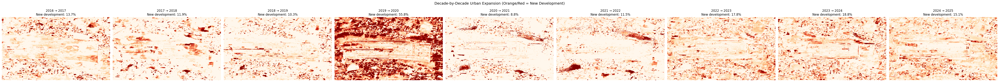

In [15]:
# Compare consecutive periods
period_keys = list(processed.keys())

if len(period_keys) >= 2:
    n_comparisons = len(period_keys) - 1
    fig, axes = plt.subplots(1, n_comparisons, figsize=(6 * n_comparisons, subplot_height + 0.5))
    if n_comparisons == 1:
        axes = [axes]
    
    for idx in range(n_comparisons):
        early_key = period_keys[idx]
        later_key = period_keys[idx + 1]
        
        # Compute change
        dndbi = processed[later_key]['ndbi'] - processed[early_key]['ndbi']
        
        # New development = positive dNDBI
        im = axes[idx].imshow(dndbi, cmap='OrRd', vmin=0, vmax=0.25, aspect='auto')
        
        new_dev_pct = 100 * np.sum(dndbi > 0.08) / dndbi.size
        axes[idx].set_title(f"{early_key} → {later_key}\nNew development: {new_dev_pct:.1f}%", fontsize=12)
        axes[idx].axis('off')
    
    plt.suptitle("Decade-by-Decade Urban Expansion (Orange/Red = New Development)", fontsize=14)
    plt.tight_layout()
    plt.show()
else:
    print("Need at least 2 time periods for change detection")

---
## 11. Total Change: First to Last

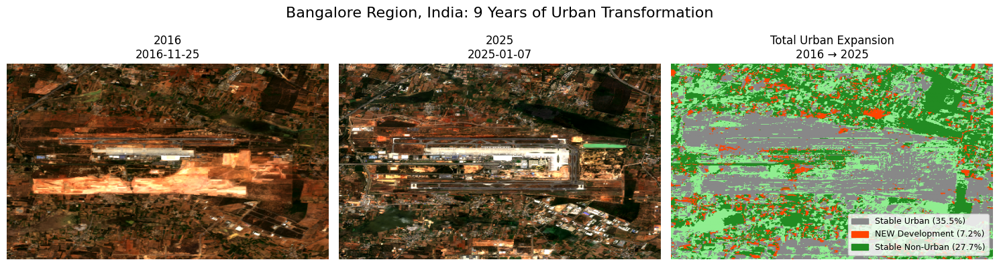

In [16]:
if len(period_keys) >= 2:
    first_key = period_keys[0]
    last_key = period_keys[-1]
    
    # Compute total change
    total_dndbi = processed[last_key]['ndbi'] - processed[first_key]['ndbi']
    
    # Classify change
    def classify_change(early_ndbi, recent_ndbi):
        change = np.zeros_like(early_ndbi, dtype=np.int8)
        urban_threshold = 0.05
        
        # Stable urban
        change[(early_ndbi > urban_threshold) & (recent_ndbi > urban_threshold)] = 0
        # New development
        change[(early_ndbi <= urban_threshold) & (recent_ndbi > urban_threshold)] = 1
        # Stable non-urban
        change[(early_ndbi <= urban_threshold) & (recent_ndbi <= urban_threshold)] = 2
        # Became greener (rare)
        change[(early_ndbi > urban_threshold) & (recent_ndbi <= urban_threshold)] = 3
        
        return change
    
    change_map = classify_change(processed[first_key]['ndbi'], processed[last_key]['ndbi'])
    
    # Create figure
    colors = ['#888888', '#FF4400', '#228B22', '#90EE90']
    cmap_change = ListedColormap(colors)
    bounds = [-0.5, 0.5, 1.5, 2.5, 3.5]
    norm = BoundaryNorm(bounds, cmap_change.N)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, subplot_height))
    
    # First period
    axes[0].imshow(processed[first_key]['rgb'], aspect='auto')
    axes[0].set_title(f"{first_key}\n{processed[first_key]['date']}", fontsize=12)
    axes[0].axis('off')
    
    # Last period
    axes[1].imshow(processed[last_key]['rgb'], aspect='auto')
    axes[1].set_title(f"{last_key}\n{processed[last_key]['date']}", fontsize=12)
    axes[1].axis('off')
    
    # Change map
    axes[2].imshow(change_map, cmap=cmap_change, norm=norm, aspect='auto')
    axes[2].set_title(f"Total Urban Expansion\n{first_key} → {last_key}", fontsize=12)
    axes[2].axis('off')
    
    # Legend
    patches = [
        mpatches.Patch(color=colors[0], label=f'Stable Urban ({100*np.sum(change_map==0)/change_map.size:.1f}%)'),
        mpatches.Patch(color=colors[1], label=f'NEW Development ({100*np.sum(change_map==1)/change_map.size:.1f}%)'),
        mpatches.Patch(color=colors[2], label=f'Stable Non-Urban ({100*np.sum(change_map==2)/change_map.size:.1f}%)'),
    ]
    axes[2].legend(handles=patches, loc='lower right', fontsize=9)
    
    years_span = int(processed[last_key]['date'][:4]) - int(processed[first_key]['date'][:4])
    plt.suptitle(f"{city_name}: {years_span} Years of Urban Transformation", fontsize=16)
    plt.tight_layout()
    plt.show()

---
## 12. Multi-Decade Growth Report

In [17]:
pixel_area_hectares = 0.04  # ~20m resolution = 0.04 hectares per pixel

print("="*70)
print("10-YEAR URBAN DEVELOPMENT REPORT")
print("="*70)
print(f"Location: {city_name}")
print(f"Data source: Sentinel-2 (10-20m resolution)")
print(f"Analysis period: {list(processed.keys())[0]} to {list(processed.keys())[-1]}")
print("="*70)

print("\nUrban Coverage by Year:")
print("-"*70)

prev_urban = None
for label, data in processed.items():
    urban_area = np.sum(data['ndbi'] > 0.05) * pixel_area_hectares
    
    growth_str = ""
    if prev_urban is not None:
        growth = data['urban_pct'] - prev_urban
        growth_str = f" ({growth:+.1f}pp from previous year)"
    
    print(f"{label} ({data['date']}): Urban coverage = {data['urban_pct']:.1f}%{growth_str}")
    
    prev_urban = data['urban_pct']

# Summary statistics
if len(processed) >= 2:
    first_data = list(processed.values())[0]
    last_data = list(processed.values())[-1]
    
    total_growth_pp = last_data['urban_pct'] - first_data['urban_pct']
    growth_factor = last_data['urban_pct'] / first_data['urban_pct'] if first_data['urban_pct'] > 0 else 0
    
    first_year = int(first_data['date'][:4])
    last_year = int(last_data['date'][:4])
    years = last_year - first_year
    annual_growth = total_growth_pp / years if years > 0 else 0
    
    print("\n" + "="*70)
    print("SUMMARY")
    print("="*70)
    print(f"Time span: {years} years ({first_year} - {last_year})")
    print(f"Urban coverage change: {first_data['urban_pct']:.1f}% -> {last_data['urban_pct']:.1f}%")
    print(f"Total change: {total_growth_pp:+.1f} percentage points")
    print(f"Growth factor: {growth_factor:.2f}x")
    print(f"Average annual change: {annual_growth:+.2f} pp/year")
    print("="*70)

10-YEAR URBAN DEVELOPMENT REPORT
Location: Bangalore Region, India
Data source: Sentinel-2 (10-20m resolution)
Analysis period: 2016 to 2025

Urban Coverage by Year:
----------------------------------------------------------------------
2016 (2016-11-25): Urban coverage = 65.1%
2017 (2017-12-20): Urban coverage = 52.7% (-12.5pp from previous year)
2018 (2018-10-26): Urban coverage = 38.1% (-14.5pp from previous year)
2019 (2019-11-05): Urban coverage = 31.7% (-6.4pp from previous year)
2020 (2020-12-29): Urban coverage = 64.5% (+32.7pp from previous year)
2021 (2021-12-24): Urban coverage = 43.0% (-21.4pp from previous year)
2022 (2022-10-25): Urban coverage = 20.6% (-22.4pp from previous year)
2023 (2023-10-25): Urban coverage = 24.1% (+3.5pp from previous year)
2024 (2024-12-08): Urban coverage = 32.5% (+8.4pp from previous year)
2025 (2025-01-07): Urban coverage = 42.7% (+10.2pp from previous year)

SUMMARY
Time span: 9 years (2016 - 2025)
Urban coverage change: 65.1% -> 42.7%
Total

---
## Summary: 10-Year Analysis with Sentinel-2

### What makes this analysis powerful:

| Aspect | Benefit |
|--------|--------|
| **10 years of data** | See year-over-year transformation |
| **Annual snapshots** | Understand when development accelerated |
| **High resolution (10-20m)** | See detailed urban structures |
| **Consistent methodology** | NDBI works across all years |

### Key insight:

By analyzing Sentinel-2 imagery from 2016-2025, we can track urban development at high resolution, seeing individual neighborhoods and infrastructure emerge over time.

### Applications:

- **Urban planning:** Understand recent growth patterns
- **Infrastructure monitoring:** Track new roads, buildings, industrial areas
- **Environmental impact:** Measure habitat conversion
- **Development tracking:** Monitor construction progress year by year